Name: __Kiran Shrestha__ <br>
Title: __Data for health policy__<br>
Link to the page: [here](https://stharajkiran.github.io/)<br>

# Project Goals

The project primarily investigates the data related to health factors of each counties in USA. Health factors here include health behaviors, clinical care, socio-economic factors, physical enviornment and other health outcomes. Using available data along with additional public datasets, I plan to find the find possible discoveries regarding what variables are most responsible for health outcomes. I am sure there are metrics to measure like correlations to differentiate those. Using the variables, I plan to create a model and possibly test with new data sources.

# Collaboration Plan

I plan to first find more datasets that I can relate this dataset to, and thus have more available dependent measures that could infulence the health outcomes. Maybe, the demographics, education quality, or presence or absence of certain institutions could add more light to the health results. Github will be primarily used to store all the data and notebooks.

# Import libraries

In [3]:
pip install missingno 

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np 
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# import pycountry_convert as pc 
import missingno as mno
import warnings

# Read the dataset

In [3]:
URL = "https://www.countyhealthrankings.org/sites/default/files/media/document/analytic_data2023_0.csv"
headers = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10.15; rv:101.0) Gecko/20100101 Firefox/101.0'}
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    df = pd.read_csv(URL, storage_options=headers);

In [7]:
# with warnings.catch_warnings():
#     warnings.simplefilter('ignore')
#     df = pd.read_csv("data/analytic_data2023_0.csv")

In [6]:
df.head()

,State FIPS Code,County FIPS Code,5-digit FIPS Code,State Abbreviation,Name,Release Year,County Ranked (Yes=1/No=0),Premature Death raw value,Premature Death numerator,Premature Death denominator,...,% Female raw value,% Female numerator,% Female denominator,% Female CI low,% Female CI high,% Rural raw value,% Rural numerator,% Rural denominator,% Rural CI low,% Rural CI high
0,statecode,countycode,fipscode,state,county,year,county_ranked,v001_rawvalue,v001_numerator,v001_denominator,...,v057_rawvalue,v057_numerator,v057_denominator,v057_cilow,v057_cihigh,v058_rawvalue,v058_numerator,v058_denominator,v058_cilow,v058_cihigh
1,00,000,00000,US,United States,2023,NaN,7281.9355638,4125218,917267406,...,0.5047067187,167509003,331893745,NaN,NaN,0.193,NaN,NaN,NaN,NaN
2,01,000,01000,AL,Alabama,2023,NaN,10350.071456,88086,13668498,...,0.5142542169,2591778,5039877,NaN,NaN,0.409631829,1957932,4779736,NaN,NaN
3,01,001,01001,AL,Autauga County,2023,1,8027.3947267,836,156081,...,0.513782892,30362,59095,NaN,NaN,0.4200216232,22921,54571,NaN,NaN
4,01,003,01003,AL,Baldwin County,2023,1,8118.3582061,3377,614143,...,0.5134771453,122872,239294,NaN,NaN,0.4227909911,77060,182265,NaN,NaN


In [7]:
df.shape

(3195, 720)

In [5]:
# Display top 10 columns
for col in df.columns[:10]:
    print(col)

State FIPS Code
County FIPS Code
5-digit FIPS Code
State Abbreviation
Name
Release Year
County Ranked (Yes=1/No=0)
Premature Death raw value
Premature Death numerator
Premature Death denominator


# About dataset

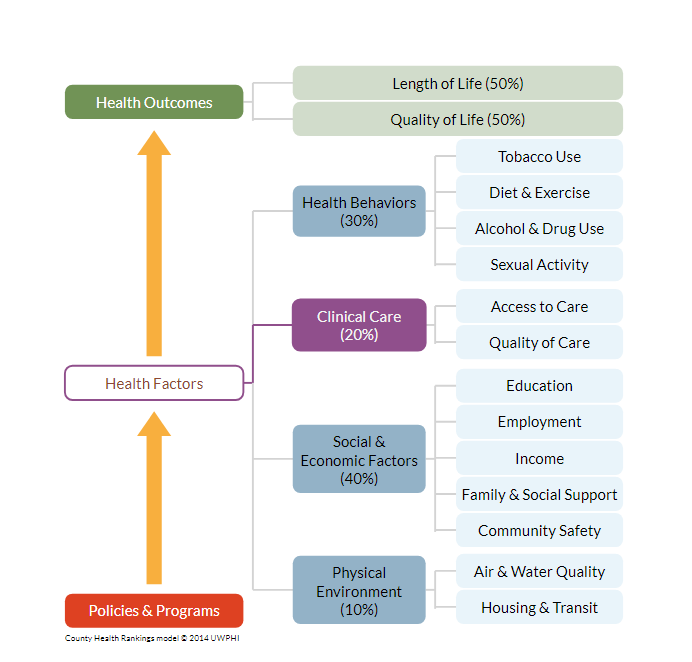

[This page](https://www.countyhealthrankings.org/explore-health-rankings/county-health-rankings-model) describes about the idea behind the dataset. [This link](https://www.countyhealthrankings.org/explore-health-rankings/rankings-data-documentation) has all the datasets from different years to download. [This page](https://www.countyhealthrankings.org/explore-health-rankings/county-health-rankings-measures) has the all the further sources that were used for mining the ultimate data. The dataset has 700+ features to work with, although there are similarities among multiple columns and missing data. <br>

Primarily, the data columns can be divided in to health factors and health outcomes. 

# Data Cleaning

In [9]:
# This plot shows the missing data
# Longer the bar, lesser the missing data 
mno.bar(df)

<Axes: >

### Drop the columns where missing value is more than 1000

In [10]:
for col in df.columns:
    if df[col].isnull().sum()>1000:
        df.drop([col], axis=1, inplace=True)

In [11]:
# cols from 720 to 326
df.shape

(3195, 326)

<Axes: >

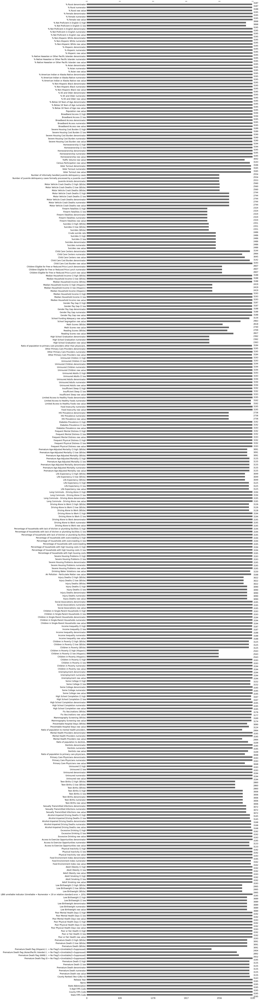

In [9]:
mno.bar(df)

### Extract the necessary columns
A lot of columns give repitative meaning. So, we extract the ones that is enough to represent the particular measurement.

In [13]:
# We need the raw values only
new_cols = [x for x in df.columns if "raw value" in x]
new_cols = list(df.columns[0:5]) + new_cols

In [14]:
# Replace % by percent
cols = list(map(lambda x:x.replace("%", "percent"), new_cols))
# Remove certain char and substring 
cols = list(map(lambda x:x.replace("-", " "), cols))
cols = list(map(lambda x:x.replace(" raw value", ""), cols))
cols = list(map(lambda x:x.replace(" ", "_"), cols))
cols = list(map(lambda x:x.replace(" ", ""), cols))
cols

['State_FIPS_Code',
 'County_FIPS_Code',
 '5_digit_FIPS_Code',
 'State_Abbreviation',
 'Name',
 'Premature_Death',
 'Poor_or_Fair_Health',
 'Poor_Physical_Health_Days',
 'Poor_Mental_Health_Days',
 'Low_Birthweight',
 'Adult_Smoking',
 'Adult_Obesity',
 'Food_Environment_Index',
 'Physical_Inactivity',
 'Access_to_Exercise_Opportunities',
 'Excessive_Drinking',
 'Alcohol_Impaired_Driving_Deaths',
 'Sexually_Transmitted_Infections',
 'Teen_Births',
 'Uninsured',
 'Primary_Care_Physicians',
 'Dentists',
 'Mental_Health_Providers',
 'Preventable_Hospital_Stays',
 'Mammography_Screening',
 'Flu_Vaccinations',
 'High_School_Completion',
 'Some_College',
 'Unemployment',
 'Children_in_Poverty',
 'Income_Inequality',
 'Children_in_Single_Parent_Households',
 'Social_Associations',
 'Injury_Deaths',
 'Air_Pollution___Particulate_Matter',
 'Drinking_Water_Violations',
 'Severe_Housing_Problems',
 'Driving_Alone_to_Work',
 'Long_Commute___Driving_Alone',
 'Life_Expectancy',
 'Premature_Age_Adjus

In [15]:
# Slice the dataframe
df = df[new_cols]
# Rename the columns
df = df.rename(columns=dict(zip(new_cols, cols)))

In [16]:
df.head(2)

,State_FIPS_Code,County_FIPS_Code,5_digit_FIPS_Code,State_Abbreviation,Name,Premature_Death,Poor_or_Fair_Health,Poor_Physical_Health_Days,Poor_Mental_Health_Days,Low_Birthweight,...,percent_65_and_Older,percent_Non_Hispanic_Black,percent_American_Indian_or_Alaska_Native,percent_Asian,percent_Native_Hawaiian_or_Other_Pacific_Islander,percent_Hispanic,percent_Non_Hispanic_White,percent_Not_Proficient_in_English,percent_Female,percent_Rural
0,statecode,countycode,fipscode,state,county,v001_rawvalue,v002_rawvalue,v036_rawvalue,v042_rawvalue,v037_rawvalue,...,v053_rawvalue,v054_rawvalue,v055_rawvalue,v081_rawvalue,v080_rawvalue,v056_rawvalue,v126_rawvalue,v059_rawvalue,v057_rawvalue,v058_rawvalue
1,00,000,00000,US,United States,7281.9355638,0.12,3,4.4,0.0819065527,...,0.1682705801,0.1261202919,0.0131594526,0.0613162595,0.0026003593,0.1887563262,0.5930615866,0.0410440385,0.5047067187,0.193


In [17]:
# remove the first row
df = df.drop([0])
df = df.reset_index(drop=True)
df.head(2)

,State_FIPS_Code,County_FIPS_Code,5_digit_FIPS_Code,State_Abbreviation,Name,Premature_Death,Poor_or_Fair_Health,Poor_Physical_Health_Days,Poor_Mental_Health_Days,Low_Birthweight,...,percent_65_and_Older,percent_Non_Hispanic_Black,percent_American_Indian_or_Alaska_Native,percent_Asian,percent_Native_Hawaiian_or_Other_Pacific_Islander,percent_Hispanic,percent_Non_Hispanic_White,percent_Not_Proficient_in_English,percent_Female,percent_Rural
0,00,000,00000,US,United States,7281.9355638,0.12,3,4.4,0.0819065527,...,0.1682705801,0.1261202919,0.0131594526,0.0613162595,0.0026003593,0.1887563262,0.5930615866,0.0410440385,0.5047067187,0.193
1,01,000,01000,AL,Alabama,10350.071456,0.189,3.4824161407,5.0732772786,0.1043276003,...,0.1763568833,0.2651199623,0.0071444204,0.0155043466,0.0010883202,0.0478519615,0.6487709918,0.0102759588,0.5142542169,0.409631829


In [18]:
# Checking the states
df["State_Abbreviation"].unique()

array(['US', 'AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL',
       'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD',
       'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM',
       'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN',
       'TX', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'], dtype=object)

In [19]:
df[df["State_Abbreviation"] =="WY"].head(3)

,State_FIPS_Code,County_FIPS_Code,5_digit_FIPS_Code,State_Abbreviation,Name,Premature_Death,Poor_or_Fair_Health,Poor_Physical_Health_Days,Poor_Mental_Health_Days,Low_Birthweight,...,percent_65_and_Older,percent_Non_Hispanic_Black,percent_American_Indian_or_Alaska_Native,percent_Asian,percent_Native_Hawaiian_or_Other_Pacific_Islander,percent_Hispanic,percent_Non_Hispanic_White,percent_Not_Proficient_in_English,percent_Female,percent_Rural
3170,56,0,56000,WY,Wyoming,7809.903503,0.115,2.698914,4.130766,0.090792,...,0.179469,0.010394,0.028395,0.010935,0.001012,0.10554,0.833306,0.006424,0.48823,0.35242
3171,56,1,56001,WY,Albany County,5133.53187,0.11,2.90064,4.179786,0.085394,...,0.129866,0.012949,0.013162,0.034567,0.001409,0.101627,0.821581,0.006262,0.47817,0.119397
3172,56,3,56003,WY,Big Horn County,9097.45733,0.123,2.998264,3.865339,0.069968,...,0.217675,0.007479,0.018054,0.005416,0.000516,0.096114,0.867435,0.015205,0.491145,1.0


The column where State_Abbreviation is US represent the country average and where State_Abbreviation is state name represent the state average.

County_FIPS_Code is 0 if county name is state itself.

### Correct the data types

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3194 entries, 0 to 3193
Data columns (total 82 columns):
 #   Column                                             Non-Null Count  Dtype 
---  ------                                             --------------  ----- 
 0   State_FIPS_Code                                    3194 non-null   object
 1   County_FIPS_Code                                   3194 non-null   object
 2   5_digit_FIPS_Code                                  3194 non-null   object
 3   State_Abbreviation                                 3194 non-null   object
 4   Name                                               3194 non-null   object
 5   Premature_Death                                    3134 non-null   object
 6   Poor_or_Fair_Health                                3192 non-null   object
 7   Poor_Physical_Health_Days                          3192 non-null   object
 8   Poor_Mental_Health_Days                            3192 non-null   object
 9   Low_Birthweight    

In [22]:
print(df.head(2).T.to_string())

                                                               0             1
State_FIPS_Code                                               00            01
County_FIPS_Code                                             000           000
5_digit_FIPS_Code                                          00000         01000
State_Abbreviation                                            US            AL
Name                                               United States       Alabama
Premature_Death                                     7281.9355638  10350.071456
Poor_or_Fair_Health                                         0.12         0.189
Poor_Physical_Health_Days                                      3  3.4824161407
Poor_Mental_Health_Days                                      4.4  5.0732772786
Low_Birthweight                                     0.0819065527  0.1043276003
Adult_Smoking                                               0.16         0.195
Adult_Obesity                                       

We can convert most of the columns into float type.

In [21]:
# Fill the NaN with np.nan
df.fillna(np.nan, inplace =True)

In [22]:
# list of cols to convert into float
to_float= [col for col in list(df.columns) if col not in list(df.columns[3:5])]
df[to_float] = df[to_float].apply(pd.to_numeric)

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3194 entries, 0 to 3193
Data columns (total 82 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   State_FIPS_Code                                    3194 non-null   int64  
 1   County_FIPS_Code                                   3194 non-null   int64  
 2   5_digit_FIPS_Code                                  3194 non-null   int64  
 3   State_Abbreviation                                 3194 non-null   object 
 4   Name                                               3194 non-null   object 
 5   Premature_Death                                    3134 non-null   float64
 6   Poor_or_Fair_Health                                3192 non-null   float64
 7   Poor_Physical_Health_Days                          3192 non-null   float64
 8   Poor_Mental_Health_Days                            3192 non-null   float64
 9   Low_Birt

In [24]:
df.describe()

,State_FIPS_Code,County_FIPS_Code,5_digit_FIPS_Code,Premature_Death,Poor_or_Fair_Health,Poor_Physical_Health_Days,Poor_Mental_Health_Days,Low_Birthweight,Adult_Smoking,Adult_Obesity,...,percent_65_and_Older,percent_Non_Hispanic_Black,percent_American_Indian_or_Alaska_Native,percent_Asian,percent_Native_Hawaiian_or_Other_Pacific_Islander,percent_Hispanic,percent_Non_Hispanic_White,percent_Not_Proficient_in_English,percent_Female,percent_Rural
count,3194.000000,3194.000000,3194.000000,3134.000000,3192.000000,3192.000000,3192.000000,3088.000000,3192.000000,3192.000000,...,3194.000000,3194.000000,3194.000000,3194.000000,3194.000000,3194.000000,3194.000000,3194.000000,3194.000000,3187.000000
mean,30.249530,101.886662,30351.417032,8891.562734,0.159942,3.511726,4.794971,0.082138,0.199762,0.361428,...,0.199929,0.090869,0.024611,0.016971,0.001625,0.102183,0.749862,0.016072,0.495715,0.580467
std,15.160981,107.624838,15179.045587,2929.948857,0.044333,0.652486,0.628114,0.020293,0.041210,0.046825,...,0.047879,0.141564,0.077649,0.030939,0.009667,0.139670,0.202763,0.026852,0.023189,0.315553
min,0.000000,0.000000,0.000000,3090.426825,0.065000,1.849017,2.779181,0.028871,0.067000,0.176000,...,0.050729,0.000000,0.000000,0.000000,0.000000,0.006827,0.026802,0.000000,0.245614,0.000000
25%,18.000000,33.000000,18171.500000,6868.647904,0.125000,3.027309,4.373272,0.068281,0.174000,0.336000,...,0.169189,0.008182,0.004311,0.005208,0.000377,0.026999,0.630136,0.002579,0.490583,0.325275
50%,29.000000,77.000000,29174.000000,8538.518058,0.152000,3.448386,4.813037,0.079532,0.198000,0.366000,...,0.195519,0.024266,0.007193,0.008099,0.000721,0.048823,0.821402,0.007069,0.499580,0.588250
75%,45.000000,133.000000,45074.500000,10494.403953,0.189000,3.946273,5.221064,0.091418,0.226000,0.391000,...,0.225286,0.104902,0.014716,0.015733,0.001357,0.108941,0.915241,0.017709,0.507127,0.861214
max,56.000000,840.000000,56045.000000,30007.870277,0.368000,6.335031,6.945581,0.216981,0.411000,0.532000,...,0.581710,0.856197,0.922567,0.420553,0.475610,0.962604,0.975921,0.384369,0.570535,1.000000


## Plotting the data

__Relationship between sleep and obesity in LA and CA__

In [25]:
x = "Adult_Obesity"
y = "Insufficient_Sleep"
z = "State_Abbreviation"
not_null_mask = df[[x,y,z]].notnull().all(axis=1)
not_null_rows = df[[x,y,z]][not_null_mask]

not_null_rows = not_null_rows.query('State_Abbreviation== "LA" or State_Abbreviation== "CA"')

<Axes: xlabel='Adult_Obesity', ylabel='Insufficient_Sleep'>

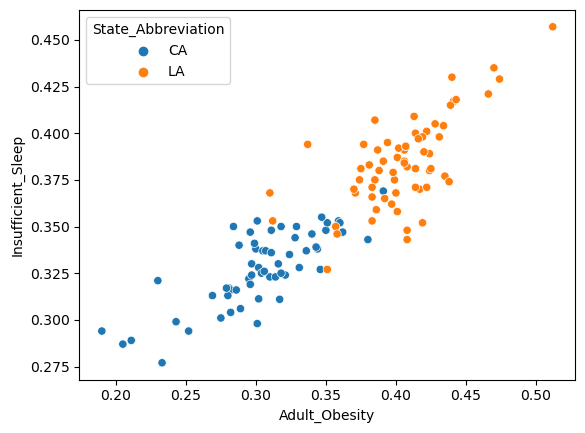

In [26]:
sns.scatterplot(data=not_null_rows, x = x, y = y, hue = z)

### Checking correlations between few columns

<Axes: xlabel='Broadband_Access', ylabel='Math_Scores'>

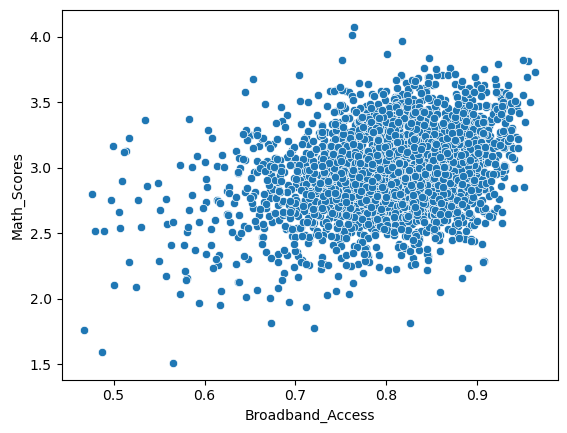

In [27]:
sns.scatterplot(data=df, x = "Broadband_Access", y = "Math_Scores")

__Splitting the columns into health factors(variables) and healt outcomes types(target)__

In [28]:
target_cols = ['Premature_Death', 'Life_Expectancy', 'Premature_Age_Adjusted_Mortality', 
'Poor_or_Fair_Health','Poor_Physical_Health_Days', 'Poor_Mental_Health_Days','Low_Birthweight', 
'Frequent_Physical_Distress','Frequent_Mental_Distress', 'Diabetes_Prevalence', 'HIV_Prevalence']

In [29]:
variable_cols = [x for x in df.columns[5:] if x not in target_cols]

In [30]:
df_corr = df.iloc[:,5:].corr()
df_corr.shape

(77, 77)

### Correlation measurements

In [31]:
df_corr = df_corr[variable_cols]
df_corr = df_corr.loc[target_cols]
df_corr.shape

(11, 66)

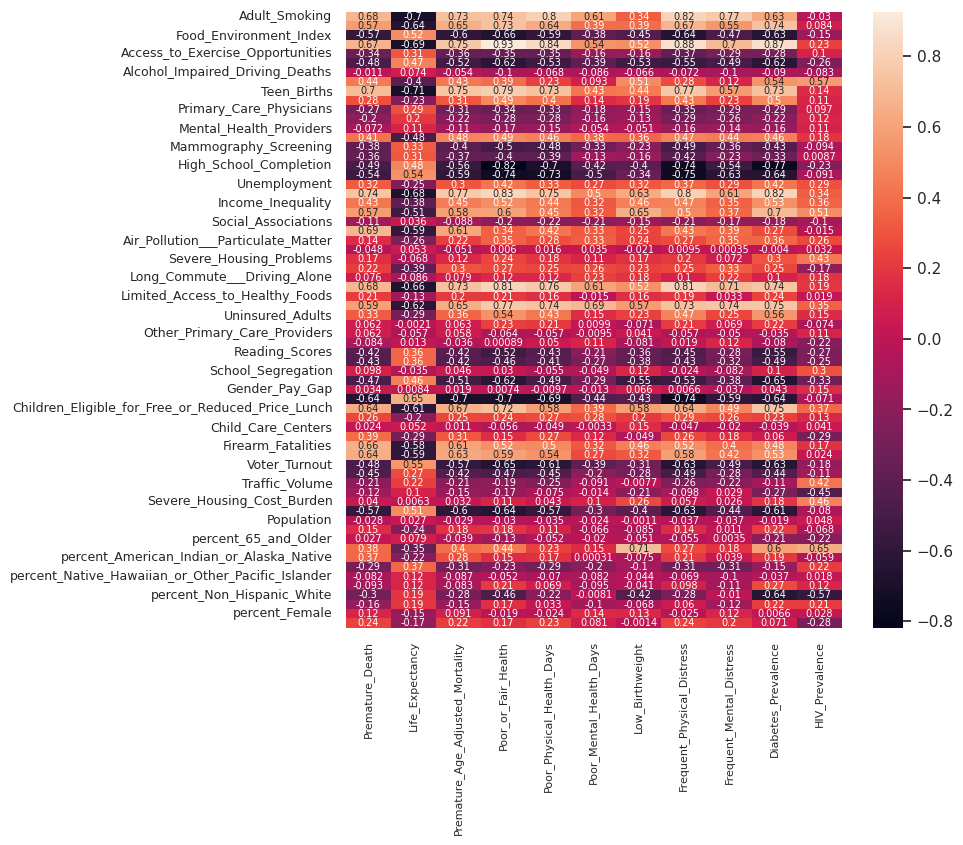

In [36]:
sns.heatmap(df_corr.T, annot = True, annot_kws={"fontsize":7})
plt.xticks(fontsize=8)
plt.yticks(fontsize=9)
sns.set(rc={'figure.figsize':(10,15)})

__Finding the features obesity is most correlated to__

In [33]:
obesity_corr = list(df.iloc[:, 5:].corr()[["Adult_Obesity"]].sort_values(by = "Adult_Obesity").index)
obesity_corr = obesity_corr[:5] + obesity_corr[-7:-1]
obesity_corr

['Life_Expectancy',
 'Median_Household_Income',
 'Some_College',
 'Voter_Turnout',
 'Broadband_Access',
 'Premature_Age_Adjusted_Mortality',
 'Frequent_Physical_Distress',
 'Adult_Smoking',
 'Poor_or_Fair_Health',
 'Diabetes_Prevalence',
 'Physical_Inactivity']

__Few more plots__

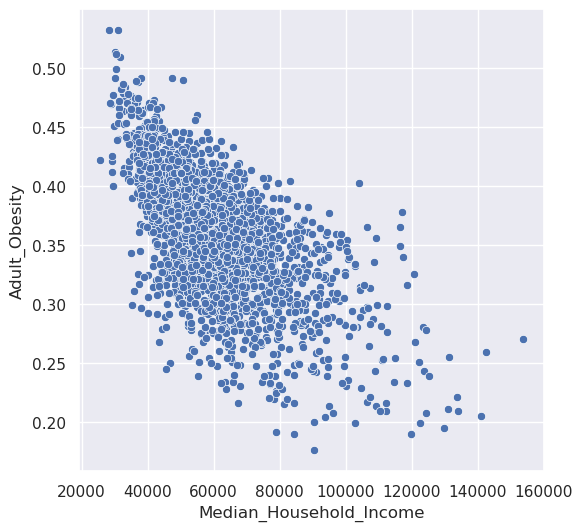

In [42]:
sns.scatterplot(data=df, x = "Median_Household_Income", y = "Adult_Obesity")
sns.set(rc={'figure.figsize':(6,6)})

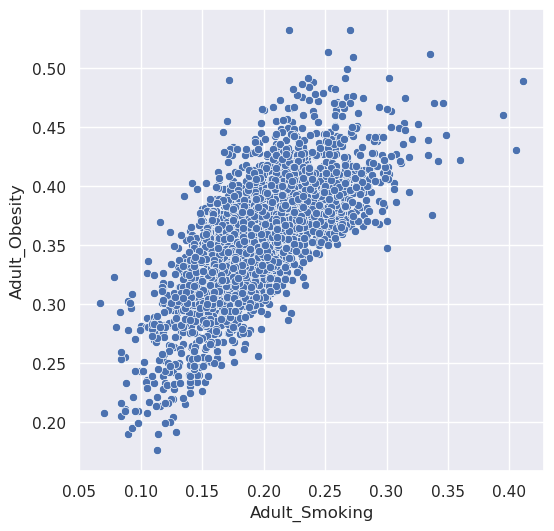

In [43]:
sns.scatterplot(data=df, x = "Adult_Smoking", y = "Adult_Obesity")
sns.set(rc={'figure.figsize':(6,6)})

### Extracting state average

In [44]:
state_df = df[ pd.to_numeric(df["County_FIPS_Code"]) == 0]

### Plot the obesity rates among all the states including national average

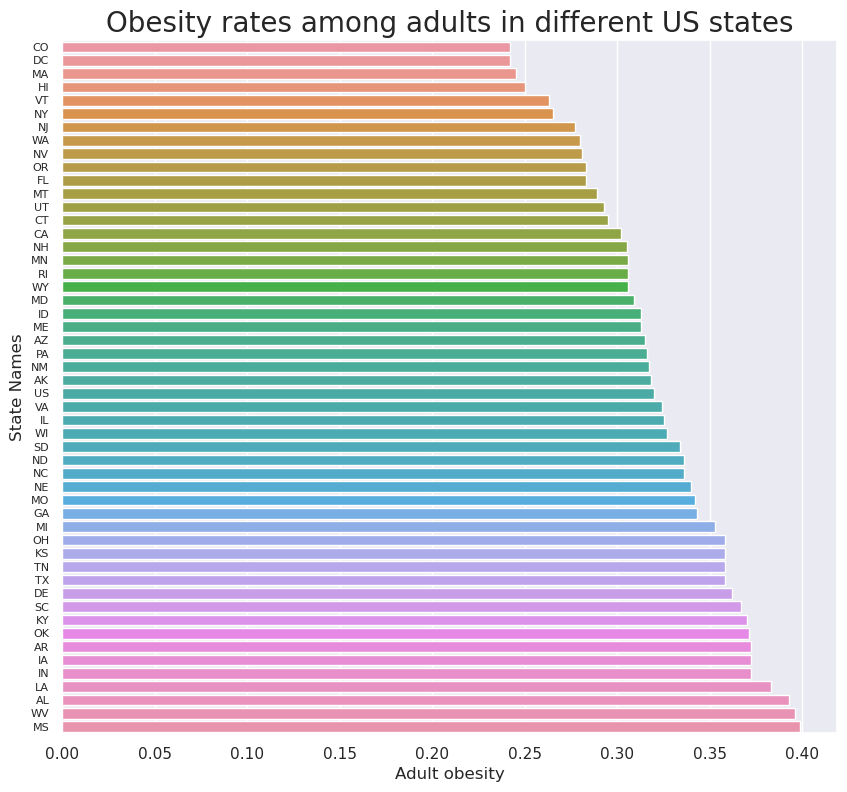

In [46]:
sns.barplot(state_df.sort_values(by = ["Adult_Obesity"]), x="Adult_Obesity", y="State_Abbreviation")
plt.ylabel("State Names")
plt.xlabel("Adult obesity")
plt.yticks(fontsize=8)
plt.title("Obesity rates among adults in different US states", {'fontsize': 20} )
sns.set(rc={'figure.figsize':(10,9)})

# Closing Thoughts and Final Goals

I plan to explore the datasets why some states or counties are good in health comes  and why others are not. Other questions include, "what factors influence the health outcomes the most?","What affects the obesity most?", "Does the state/county location matter in health outcome?","why certain demograohic has a correlation with health results?" and so on. <br>

Besides, it would be cool to explore how political preferences affect the health status of a certain area. Directly or indirectly, there will be some influence in the policies, which futher influences the general public's health behaviors. <br>

Similarly, [socailly vulnerability](https://www.atsdr.cdc.gov/placeandhealth/svi/documentation/SVI_documentation_2020.html) might have association to health outcomes too. So, I plan to explore more into it.

Hopefully, I can find more data and variables to merge with this one, and with better data analysis, I could figure what variables to include in a model. Here, the model will be used to predict the health outcome such as mortality or obesity based on easily available dataset.